<a href="https://colab.research.google.com/github/pras-4795/JPMCColab/blob/main/Water1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

In [ ]:
%time
# Set your environment in a notebook:
# Set the Environment
# Ignore Warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
#Write out the versions of all packages to requirements.txt
!pip freeze >> requirements.txt
# Remove the restriction on Jupyter that limits the columns displayed (the ... in the middle)
# pd.set_option('max_columns',None)
pd.options.display.max_columns = None
# pd.options.display.max_rows = None
# Docs: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.set_option.html#
# Pretty Display of variables.  for instance, you can call df.head() and df.tail() in the same cell and BOTH display w/o print
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
# List of ALL Magic Commands.  To run a magic command %var  --- i.e.:  %env
%lsmagic

CPU times: user 945 µs, sys: 0 ns, total: 945 µs
Wall time: 1.13 ms


Available line magics:
%alias  %alias_magic  %autoawait  %autocall  %automagic  %autosave  %bookmark  %cat  %cd  %clear  %colors  %conda  %config  %connect_info  %cp  %debug  %dhist  %dirs  %doctest_mode  %ed  %edit  %env  %gui  %hist  %history  %killbgscripts  %ldir  %less  %lf  %lk  %ll  %load  %load_ext  %loadpy  %logoff  %logon  %logstart  %logstate  %logstop  %ls  %lsmagic  %lx  %macro  %magic  %man  %matplotlib  %mkdir  %more  %mv  %notebook  %page  %pastebin  %pdb  %pdef  %pdoc  %pfile  %pinfo  %pinfo2  %pip  %popd  %pprint  %precision  %prun  %psearch  %psource  %pushd  %pwd  %pycat  %pylab  %qtconsole  %quickref  %recall  %rehashx  %reload_ext  %rep  %rerun  %reset  %reset_selective  %rm  %rmdir  %run  %save  %sc  %set_env  %shell  %store  %sx  %system  %tb  %tensorflow_version  %time  %timeit  %unalias  %unload_ext  %who  %who_ls  %whos  %xdel  %xmode

Available cell magics:
%%!  %%HTML  %%SVG  %%bash  %%bigquery  %%capture  %%debug  %%file  %%html  %%javascript  %%js  %%late

In [ ]:
from sklearn import set_config
set_config(display='diagram')
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)
# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"
print("\n Numpy: " + np.__version__)
print("\n sklearn: " + sklearn.__version__)


 Numpy: 1.23.5

 sklearn: 1.2.2


In [ ]:
from google.colab import files


uploaded = files.upload()

Saving water1.csv to water1.csv


In [ ]:
import io
df = pd.read_csv(io.BytesIO(uploaded['water1.csv']))
print(df)

      aluminium ammonia  arsenic  barium  cadmium  chloramine  chromium  \
0          1.65    9.08     0.04    2.85    0.007        0.35      0.83   
1          2.32   21.16     0.01    3.31    0.002        5.28      0.68   
2          1.01   14.02     0.04    0.58    0.008        4.24      0.53   
3          1.36   11.33     0.04    2.96    0.001        7.23      0.03   
4          0.92   24.33     0.03    0.20    0.006        2.67      0.69   
...         ...     ...      ...     ...      ...         ...       ...   
7994       0.05    7.78     0.00    1.95    0.040        0.10      0.03   
7995       0.05   24.22     0.02    0.59    0.010        0.45      0.02   
7996       0.09    6.85     0.00    0.61    0.030        0.05      0.05   
7997       0.01      10     0.01    2.00    0.000        2.00      0.00   
7998       0.04    6.85     0.01    0.70    0.030        0.05      0.01   

      copper  flouride  bacteria  viruses   lead  nitrates  nitrites  mercury  \
0       0.17      

In [ ]:
cols_list = df.columns.tolist()
cols_list= cols_list[:-1]
cols_list

['aluminium',
 'ammonia',
 'arsenic',
 'barium',
 'cadmium',
 'chloramine',
 'chromium',
 'copper',
 'flouride',
 'bacteria',
 'viruses',
 'lead',
 'nitrates',
 'nitrites',
 'mercury',
 'perchlorate',
 'radium',
 'selenium',
 'silver',
 'uranium']

In [ ]:
index_names = df[ df['ammonia'] == '#NUM!' ].index

df.drop(index_names, inplace = True)

In [ ]:
df['ammonia'] = pd.to_numeric(df['ammonia'], errors='coerce', downcast='float')

In [ ]:
df.loc[:,'is_safe'] = df.loc[:,'is_safe'].astype(int)

<ipython-input-11-de600e209e2d>:1: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.loc[:,'is_safe'] = df.loc[:,'is_safe'].astype(int)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7996 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7996 non-null   float64
 1   ammonia      7996 non-null   float32
 2   arsenic      7996 non-null   float64
 3   barium       7996 non-null   float64
 4   cadmium      7996 non-null   float64
 5   chloramine   7996 non-null   float64
 6   chromium     7996 non-null   float64
 7   copper       7996 non-null   float64
 8   flouride     7996 non-null   float64
 9   bacteria     7996 non-null   float64
 10  viruses      7996 non-null   float64
 11  lead         7996 non-null   float64
 12  nitrates     7996 non-null   float64
 13  nitrites     7996 non-null   float64
 14  mercury      7996 non-null   float64
 15  perchlorate  7996 non-null   float64
 16  radium       7996 non-null   float64
 17  selenium     7996 non-null   float64
 18  silver       7996 non-null   float64
 19  uraniu

<Figure size 1200x1500 with 0 Axes>

<Axes: >

<Axes: xlabel='aluminium', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of aluminium')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='ammonia', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of ammonia')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='arsenic', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of arsenic')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='barium', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of barium')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='cadmium', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of cadmium')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='chloramine', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of chloramine')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='chromium', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of chromium')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='copper', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of copper')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='flouride', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of flouride')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='bacteria', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of bacteria')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='viruses', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of viruses')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='lead', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of lead')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='nitrates', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of nitrates')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='nitrites', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of nitrites')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='mercury', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of mercury')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='perchlorate', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of perchlorate')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='radium', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of radium')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='selenium', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of selenium')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='silver', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of silver')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='uranium', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of uranium')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

<Axes: >

<Axes: xlabel='is_safe', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of is_safe')

Text(0.5, 0, '')

Text(0, 0.5, 'Density')

Text(0.5, 0.98, 'Distribution of Data')

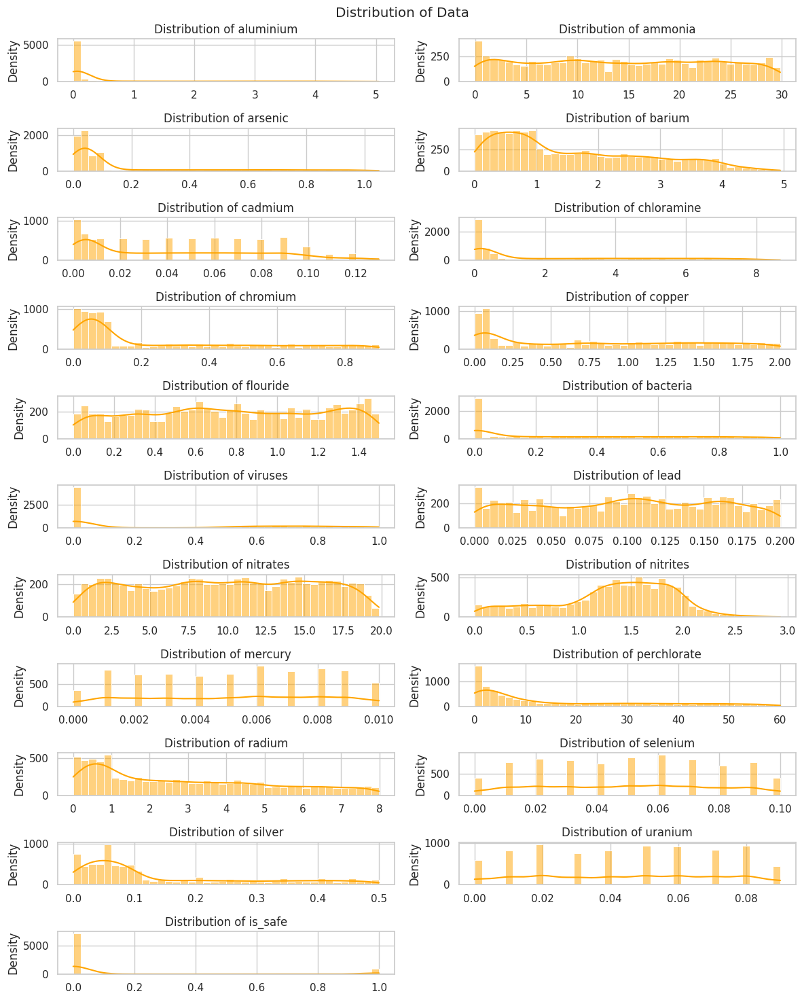

In [ ]:
sns.set(style='whitegrid')

# Plot histograms for the distribution of all columns
plt.figure(figsize=(12, 15))
data_columns = df.columns.tolist()

# Adjust the number of rows and columns in the subplot grid for better visualization
num_rows = len(data_columns) // 2 + len(data_columns) % 2
num_cols = 2

for i, column in enumerate(data_columns):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.histplot(df[column], kde=True, color='orange', bins=40)
    plt.title(f'Distribution of {column}', fontsize=12)
    plt.xlabel('')
    plt.ylabel('Density')

plt.suptitle("Distribution of Data")
plt.tight_layout()
plt.show()

In [ ]:
df.nunique()

aluminium       495
ammonia        2563
arsenic         107
barium          480
cadmium          23
chloramine      812
chromium         91
copper          201
flouride        151
bacteria        101
viruses          61
lead            200
nitrates       1803
nitrites        280
mercury          11
perchlorate    2999
radium          735
selenium         11
silver           51
uranium          10
is_safe           2
dtype: int64

In [ ]:
df.shape

(7996, 21)

<Axes: >

<Figure size 1000x600 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Correlation of Numeric Features with is_safe')

Text(0.5, 0, 'Correlation Coefficient')

Text(0, 0.5, 'Numeric Features')

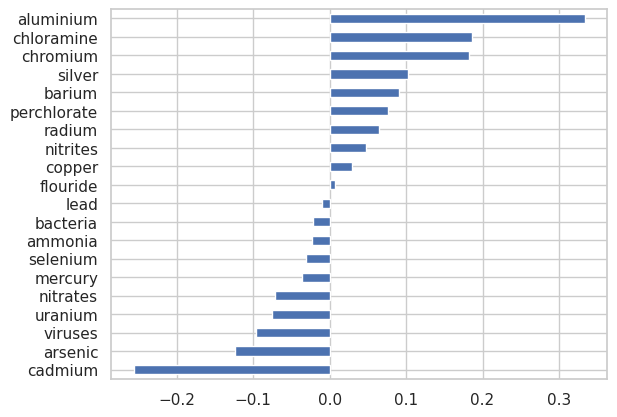

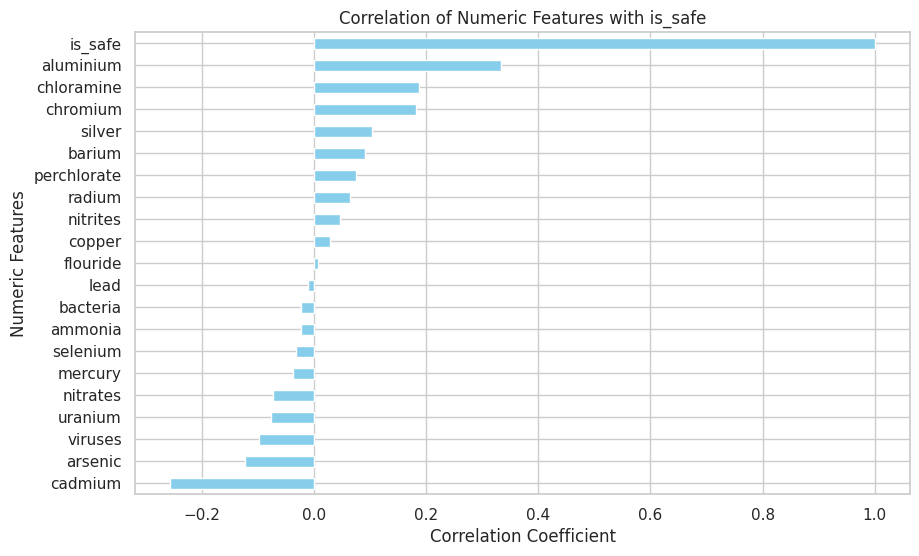

In [ ]:
correlation_with_target = df.corr().loc[:, 'is_safe']
correlation_with_target.drop('is_safe').sort_values().plot(kind='barh')

plt.figure(figsize=(10,6))
correlation_with_target.sort_values().plot(kind='barh', color='skyblue')
plt.title("Correlation of Numeric Features with is_safe")
plt.xlabel("Correlation Coefficient")
plt.ylabel("Numeric Features")
plt.show()

In [ ]:
variances = df.select_dtypes(include=['float64']).var()
low_variance_cols = variances[variances < 0.1].index.tolist()
low_variance_cols

['arsenic',
 'cadmium',
 'chromium',
 'lead',
 'mercury',
 'selenium',
 'silver',
 'uranium']

In [ ]:
cols_continuous = df.select_dtypes(include="number").nunique() >= 10

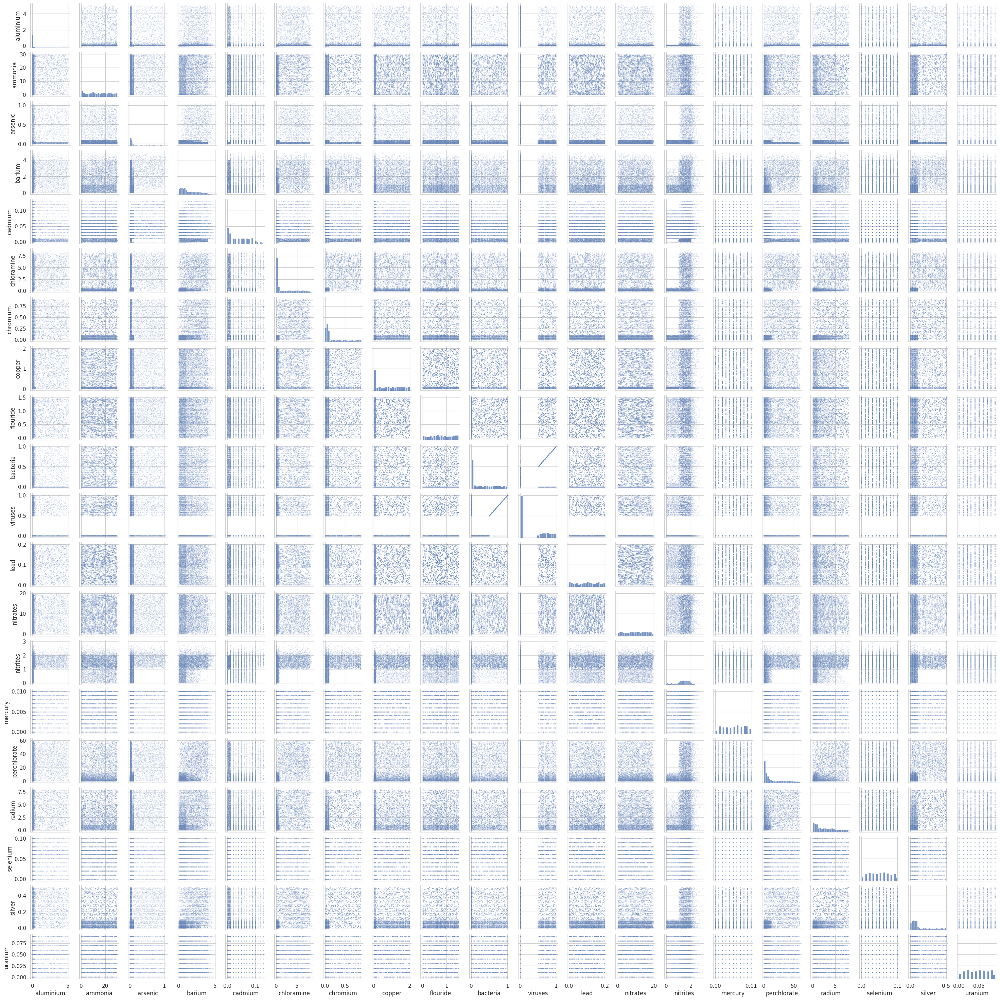

In [ ]:
df_continuous = df[cols_continuous[cols_continuous].index]
df_continuous.shape

sns.pairplot(df_continuous, height=1.5, plot_kws={"s": 2, "alpha": 0.2});

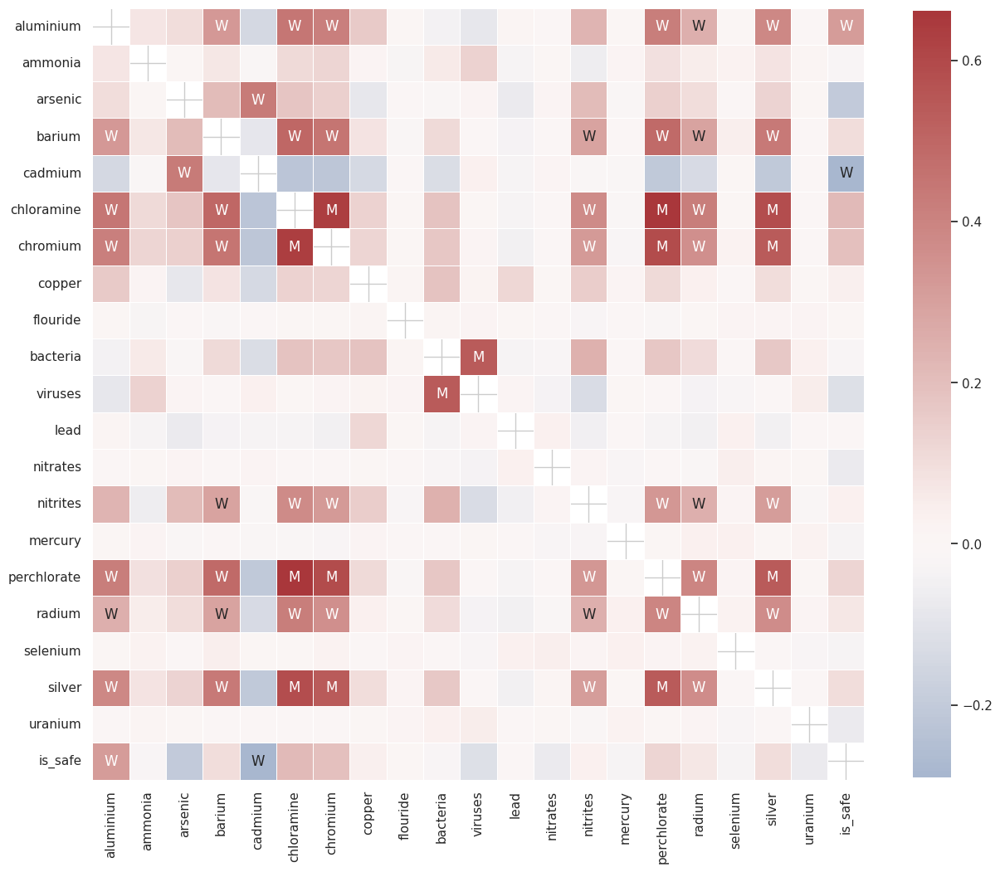

In [ ]:
df_corr = df.corr(method="spearman") # pearson assumes a linear relationship... spearman does not

# Create labels for the correlation matrix
labels = np.where(np.abs(df_corr)>0.75, "S",
                  np.where(np.abs(df_corr)>0.5, "M",
                           np.where(np.abs(df_corr)>0.25, "W", "")))

# Plot correlation matrix
plt.figure(figsize=(15, 15))
sns.heatmap(df_corr, mask=np.eye(len(df_corr)), square=True,
            center=0, annot=labels, fmt='', linewidths=.5,
            cmap="vlag", cbar_kws={"shrink": 0.8});

<Figure size 1500x1500 with 0 Axes>

<Axes: >

<Axes: xlabel='is_safe', ylabel='aluminium'>

Text(0.5, 1.0, 'aluminium')

<Axes: >

<Axes: xlabel='is_safe', ylabel='ammonia'>

Text(0.5, 1.0, 'ammonia')

<Axes: >

<Axes: xlabel='is_safe', ylabel='arsenic'>

Text(0.5, 1.0, 'arsenic')

<Axes: >

<Axes: xlabel='is_safe', ylabel='barium'>

Text(0.5, 1.0, 'barium')

<Axes: >

<Axes: xlabel='is_safe', ylabel='cadmium'>

Text(0.5, 1.0, 'cadmium')

<Axes: >

<Axes: xlabel='is_safe', ylabel='chloramine'>

Text(0.5, 1.0, 'chloramine')

<Axes: >

<Axes: xlabel='is_safe', ylabel='chromium'>

Text(0.5, 1.0, 'chromium')

<Axes: >

<Axes: xlabel='is_safe', ylabel='copper'>

Text(0.5, 1.0, 'copper')

<Axes: >

<Axes: xlabel='is_safe', ylabel='flouride'>

Text(0.5, 1.0, 'flouride')

<Axes: >

<Axes: xlabel='is_safe', ylabel='bacteria'>

Text(0.5, 1.0, 'bacteria')

<Axes: >

<Axes: xlabel='is_safe', ylabel='viruses'>

Text(0.5, 1.0, 'viruses')

<Axes: >

<Axes: xlabel='is_safe', ylabel='lead'>

Text(0.5, 1.0, 'lead')

<Axes: >

<Axes: xlabel='is_safe', ylabel='nitrates'>

Text(0.5, 1.0, 'nitrates')

<Axes: >

<Axes: xlabel='is_safe', ylabel='nitrites'>

Text(0.5, 1.0, 'nitrites')

<Axes: >

<Axes: xlabel='is_safe', ylabel='mercury'>

Text(0.5, 1.0, 'mercury')

<Axes: >

<Axes: xlabel='is_safe', ylabel='perchlorate'>

Text(0.5, 1.0, 'perchlorate')

<Axes: >

<Axes: xlabel='is_safe', ylabel='radium'>

Text(0.5, 1.0, 'radium')

<Axes: >

<Axes: xlabel='is_safe', ylabel='selenium'>

Text(0.5, 1.0, 'selenium')

<Axes: >

<Axes: xlabel='is_safe', ylabel='silver'>

Text(0.5, 1.0, 'silver')

<Axes: >

<Axes: xlabel='is_safe', ylabel='uranium'>

Text(0.5, 1.0, 'uranium')

<Axes: >

<Axes: xlabel='is_safe', ylabel='is_safe'>

Text(0.5, 1.0, 'is_safe')

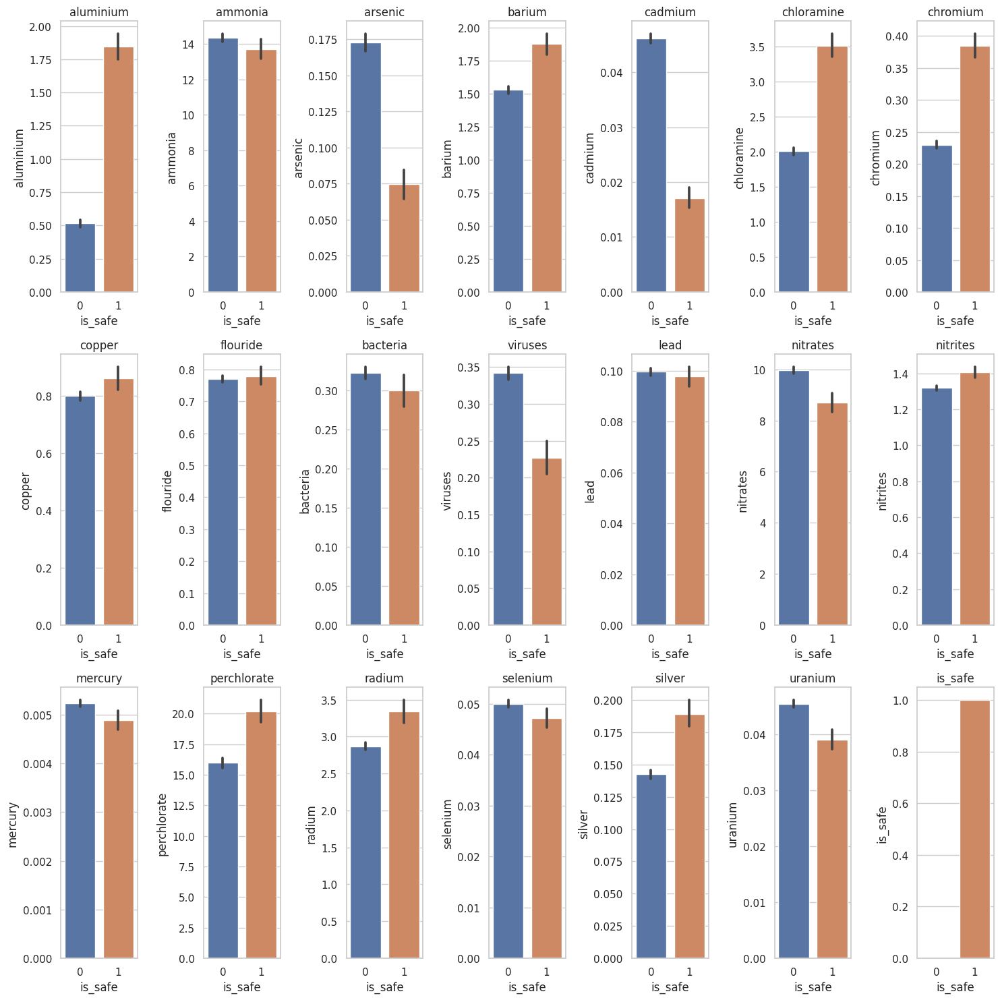

In [ ]:
r=3
c=7
it=1
plt.figure(figsize=(15, 15))
for i in df.columns:
    plt.subplot(r,c,it)
    sns.barplot(y=df.loc[:,i],x='is_safe',data=df)
    plt.title(i)
    it+=1
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import mutual_info_score
def calculate_mi(series):
    return mutual_info_score(series, df.is_safe)

df_mi = df[cols_list].apply(calculate_mi)
df_mi = df_mi.sort_values(ascending=False).to_frame(name='MI')


display(df_mi.head(20))

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/cluster/_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/cluster/_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/cluster/_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/cluster/_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and binary values for target
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.1

,MI
perchlorate,0.167190
ammonia,0.141577
aluminium,0.110616
nitrates,0.088289
chloramine,0.081810
cadmium,0.079865
radium,0.051366
arsenic,0.039936
barium,0.034974
chromium,0.032674


In [ ]:
#df.drop(columns=['chromium','bacteria', 'lead', 'flouride'], axis=1 , inplace=True)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score
x = df.iloc[:,:-1]
y = df.iloc[:,-1]
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.2, random_state = 2)

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
xtrain = scaler.fit_transform(xtrain)
xtest = scaler.transform(xtest)

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(solver='liblinear', random_state=1)
model.fit(xtrain, ytrain)
print("The accuracy of this model is: ", model.score(xtest, ytest)*100)
predict = model.predict(xtest)
print(classification_report(ytest, predict))

LogisticRegression(random_state=1, solver='liblinear')

The accuracy of this model is:  91.25
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      1439
           1       0.62      0.33      0.43       161

    accuracy                           0.91      1600
   macro avg       0.78      0.65      0.69      1600
weighted avg       0.90      0.91      0.90      1600



<Axes: >

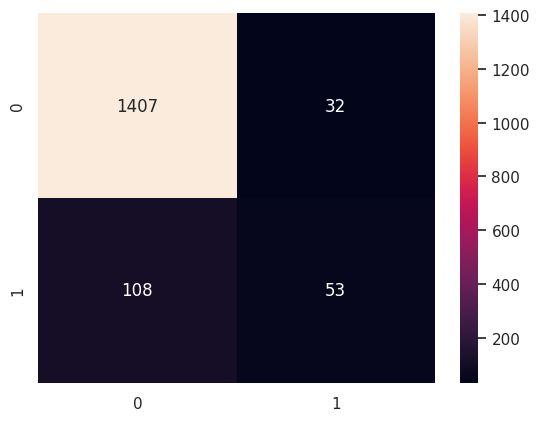

In [ ]:
y_pred = model.predict(xtest)

cm = confusion_matrix(ytest, y_pred)
sns.heatmap(cm,annot=True, fmt = 'g')

In [ ]:
from sklearn.metrics import roc_auc_score
roc_auc_score(ytest, y_pred)

0.6534774407693404

<Figure size 500x500 with 0 Axes>

(-0.02, 1.02)

(-0.02, 1.02)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'ROC curve')

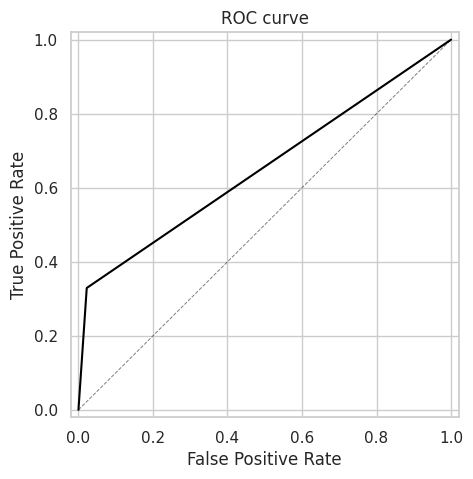

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
fpr, tpr, thresholds = roc_curve(ytest, y_pred)
plt.figure(figsize=(5, 5))

plt.plot(fpr, tpr, color='black')
plt.plot([0, 1], [0, 1], color='black', lw=0.7, linestyle='dashed', alpha=0.5)

plt.xlim([-0.02, 1.02])
plt.ylim([-0.02, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('ROC curve')

plt.show()

In [ ]:
def train(df, y, C=1.0):

    scaler = StandardScaler()
    xtrain = scaler.fit_transform(xtrain)
    xtest = scaler.transform(xtest)
    model = LogisticRegression(solver='liblinear', C=C)
    model.fit(xtrain, y)

    return xtest, model

In [ ]:
from sklearn.model_selection import KFold
nfolds = 5
kfold = KFold(n_splits=nfolds, shuffle=True, random_state=1)

for C in [0.001, 0.01, 0.1, 0.5, 1, 10]:
    aucs = []

    for train_idx, val_idx in kfold.split(df):
        xtrain = df.iloc[train_idx]
        xtest = df.iloc[val_idx]

        ytrain = xtrain.is_safe.values
        ytest = xtest.is_safe.values

        scaler = StandardScaler()
        xtrain = scaler.fit_transform(xtrain)
        xtest = scaler.transform(xtest)
        model = LogisticRegression(solver='liblinear', C=C)
        model.fit(xtrain, ytrain, C)
        predict = model.predict(xtest)
        y_pred = model.predict(xtest)
        auc = roc_auc_score(ytest, y_pred)

        aucs.append(auc)

    print('C=%s, auc = %0.3f ± %0.3f' % (C, np.mean(aucs), np.std(aucs)))

LogisticRegression(C=0.001, solver='liblinear')

LogisticRegression(C=0.001, solver='liblinear')

LogisticRegression(C=0.001, solver='liblinear')

LogisticRegression(C=0.001, solver='liblinear')

LogisticRegression(C=0.001, solver='liblinear')

C=0.001, auc = 0.986 ± 0.003


LogisticRegression(C=0.01, solver='liblinear')

LogisticRegression(C=0.01, solver='liblinear')

LogisticRegression(C=0.01, solver='liblinear')

LogisticRegression(C=0.01, solver='liblinear')

LogisticRegression(C=0.01, solver='liblinear')

C=0.01, auc = 0.998 ± 0.001


LogisticRegression(C=0.1, solver='liblinear')

LogisticRegression(C=0.1, solver='liblinear')

LogisticRegression(C=0.1, solver='liblinear')

LogisticRegression(C=0.1, solver='liblinear')

LogisticRegression(C=0.1, solver='liblinear')

C=0.1, auc = 1.000 ± 0.000


LogisticRegression(C=0.5, solver='liblinear')

LogisticRegression(C=0.5, solver='liblinear')

LogisticRegression(C=0.5, solver='liblinear')

LogisticRegression(C=0.5, solver='liblinear')

LogisticRegression(C=0.5, solver='liblinear')

C=0.5, auc = 1.000 ± 0.000


LogisticRegression(C=1, solver='liblinear')

LogisticRegression(C=1, solver='liblinear')

LogisticRegression(C=1, solver='liblinear')

LogisticRegression(C=1, solver='liblinear')

LogisticRegression(C=1, solver='liblinear')

C=1, auc = 1.000 ± 0.000


LogisticRegression(C=10, solver='liblinear')

LogisticRegression(C=10, solver='liblinear')

LogisticRegression(C=10, solver='liblinear')

LogisticRegression(C=10, solver='liblinear')

LogisticRegression(C=10, solver='liblinear')

C=10, auc = 1.000 ± 0.000


In [ ]:
from sklearn.model_selection import KFold
nfolds = 5
kfold = KFold(n_splits=nfolds, shuffle=True, random_state=1)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import roc_auc_score
from time import time
from sklearn.metrics import explained_variance_score, mean_absolute_error, r2_score
from matplotlib import pyplot
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression, SGDClassifier, RidgeClassifier, PassiveAggressiveClassifier, Perceptron
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB, BernoulliNB, ComplementNB, MultinomialNB
from sklearn.svm import SVC, NuSVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, BaggingClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier

In [ ]:
models = []
models.append(('LR', LogisticRegression(solver='liblinear')))
models.append(('SGD', SGDClassifier()))
models.append(('Ridge', RidgeClassifier()))
models.append(('PAC', PassiveAggressiveClassifier()))
models.append(('Perceptron', Perceptron()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('QDA', QuadraticDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('NearestCentroid', NearestCentroid()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('ExtraTree', ExtraTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('BNB', BernoulliNB()))
models.append(('SVM', SVC(gamma='auto')))

models.append(('RF', RandomForestClassifier()))
models.append(('GB', GradientBoostingClassifier()))
models.append(('ExtraTrees', ExtraTreesClassifier()))
models.append(('Bagging', BaggingClassifier()))
models.append(('AdaBoost', AdaBoostClassifier()))
models.append(('MLP', MLPClassifier()))
models.append(('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss')))

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


In [ ]:
xgb = XGBClassifier(use_label_encoder=False)



In [ ]:
?xgb

In [ ]:
param_dist = {
    'n_estimators': [10, 20, 30, 100, 125],
    'max_depth':[100, 125, 150],
    'max_bin' : [10, 20, 30, 40],
    'sampling_method': ['uniform', 'gradient_based'],
    'reg_alpha' : [0.1, 0.5, 0.95, 1],
    'reg_lambda' : [0.1, 0.5, 0.95, 1]
}

In [ ]:
from sklearn import model_selection
rscv = model_selection.RandomizedSearchCV(estimator=xgb, param_distributions=param_dist, n_iter=50, cv=5, scoring='accuracy' , random_state=100)

In [ ]:
rscv.fit(xtrain,ytrain)

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:1395: UserWarnin

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None, ...),
                   n_iter=50,
                   param_distributions={'max_bin': [10, 20, 30, 40],
                                        'max_depth': [100, 125, 150],
                                        'n_estimators': [10, 20, 30, 100, 125],
                                        'reg_alpha': [0.1, 0.5, 0.95, 1],
                                        'reg_lambda': [0.1, 0.5, 0.95, 1],
                                        'sampling_method': ['uniform',
                                                            'gradient_based']},
                   random_state=100, scoring='accuracy')

In [ ]:
import pandas as pd
# convert the dictionary of results to a pandas dataframe
results = pd.DataFrame(rscv.cv_results_)
# removing duplication
distinct_results = results.loc[:,['params','mean_test_score']]
# convert the params dictionaries to string data types
distinct_results.loc[:,'params'] = distinct_results.loc[:,'params'].astype('str')
# remove duplicates
distinct_results.drop_duplicates(inplace=True)
# look at the top 5 best hyperparamaterizations
distinct_results.sort_values('mean_test_score', ascending=False).head(10)

,params,mean_test_score
27,"{'sampling_method': 'gradient_based', 'reg_lam...",0.968105
43,"{'sampling_method': 'uniform', 'reg_lambda': 1...",0.967948
21,"{'sampling_method': 'gradient_based', 'reg_lam...",0.967792
34,"{'sampling_method': 'uniform', 'reg_lambda': 1...",0.967636
6,"{'sampling_method': 'uniform', 'reg_lambda': 0...",0.967479
32,"{'sampling_method': 'gradient_based', 'reg_lam...",0.967479
33,"{'sampling_method': 'uniform', 'reg_lambda': 0...",0.967479
48,"{'sampling_method': 'gradient_based', 'reg_lam...",0.967323
38,"{'sampling_method': 'gradient_based', 'reg_lam...",0.967323
22,"{'sampling_method': 'gradient_based', 'reg_lam...",0.967323


In [ ]:
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    print(name)
    kfold = KFold(n_splits=10, random_state=7, shuffle=True)
    model.fit(xtrain, ytrain)
    print("The accuracy of this model is: ", model.score(xtest, ytest)*100)
    predict = model.predict(xtest)
    print(classification_report(ytest, predict))



LR


LogisticRegression(solver='liblinear')

The accuracy of this model is:  91.25
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      1439
           1       0.62      0.33      0.43       161

    accuracy                           0.91      1600
   macro avg       0.78      0.65      0.69      1600
weighted avg       0.90      0.91      0.90      1600

SGD


SGDClassifier()

The accuracy of this model is:  91.0625
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1439
           1       0.59      0.38      0.46       161

    accuracy                           0.91      1600
   macro avg       0.76      0.67      0.71      1600
weighted avg       0.90      0.91      0.90      1600

Ridge


RidgeClassifier()

The accuracy of this model is:  90.6875
              precision    recall  f1-score   support

           0       0.92      0.99      0.95      1439
           1       0.62      0.20      0.30       161

    accuracy                           0.91      1600
   macro avg       0.77      0.59      0.63      1600
weighted avg       0.89      0.91      0.88      1600

PAC


PassiveAggressiveClassifier()

The accuracy of this model is:  78.1875
              precision    recall  f1-score   support

           0       0.94      0.81      0.87      1439
           1       0.23      0.50      0.31       161

    accuracy                           0.78      1600
   macro avg       0.58      0.66      0.59      1600
weighted avg       0.86      0.78      0.81      1600

Perceptron


Perceptron()

The accuracy of this model is:  86.25
              precision    recall  f1-score   support

           0       0.95      0.90      0.92      1439
           1       0.38      0.56      0.45       161

    accuracy                           0.86      1600
   macro avg       0.66      0.73      0.69      1600
weighted avg       0.89      0.86      0.87      1600

LDA


LinearDiscriminantAnalysis()

The accuracy of this model is:  90.0625
              precision    recall  f1-score   support

           0       0.94      0.95      0.95      1439
           1       0.51      0.42      0.46       161

    accuracy                           0.90      1600
   macro avg       0.72      0.69      0.70      1600
weighted avg       0.89      0.90      0.90      1600

QDA


QuadraticDiscriminantAnalysis()

The accuracy of this model is:  88.0625
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      1439
           1       0.44      0.68      0.53       161

    accuracy                           0.88      1600
   macro avg       0.70      0.79      0.73      1600
weighted avg       0.91      0.88      0.89      1600

KNN


KNeighborsClassifier()

The accuracy of this model is:  91.375
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1439
           1       0.62      0.37      0.47       161

    accuracy                           0.91      1600
   macro avg       0.78      0.67      0.71      1600
weighted avg       0.90      0.91      0.90      1600

NearestCentroid


NearestCentroid()

The accuracy of this model is:  71.3125
              precision    recall  f1-score   support

           0       0.96      0.71      0.82      1439
           1       0.23      0.77      0.35       161

    accuracy                           0.71      1600
   macro avg       0.60      0.74      0.58      1600
weighted avg       0.89      0.71      0.77      1600

CART


DecisionTreeClassifier()

The accuracy of this model is:  96.0
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1439
           1       0.77      0.86      0.81       161

    accuracy                           0.96      1600
   macro avg       0.88      0.92      0.90      1600
weighted avg       0.96      0.96      0.96      1600

ExtraTree


ExtraTreeClassifier()

The accuracy of this model is:  91.9375
              precision    recall  f1-score   support

           0       0.95      0.96      0.96      1439
           1       0.60      0.60      0.60       161

    accuracy                           0.92      1600
   macro avg       0.78      0.78      0.78      1600
weighted avg       0.92      0.92      0.92      1600

NB


GaussianNB()

The accuracy of this model is:  85.375
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      1439
           1       0.37      0.65      0.47       161

    accuracy                           0.85      1600
   macro avg       0.66      0.76      0.69      1600
weighted avg       0.90      0.85      0.87      1600

BNB


BernoulliNB()

The accuracy of this model is:  87.1875
              precision    recall  f1-score   support

           0       0.95      0.91      0.93      1439
           1       0.40      0.54      0.46       161

    accuracy                           0.87      1600
   macro avg       0.67      0.72      0.69      1600
weighted avg       0.89      0.87      0.88      1600

SVM


SVC(gamma='auto')

The accuracy of this model is:  94.1875
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1439
           1       0.87      0.50      0.63       161

    accuracy                           0.94      1600
   macro avg       0.91      0.74      0.80      1600
weighted avg       0.94      0.94      0.93      1600

RF


RandomForestClassifier()

The accuracy of this model is:  95.9375
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1439
           1       0.86      0.71      0.78       161

    accuracy                           0.96      1600
   macro avg       0.92      0.85      0.88      1600
weighted avg       0.96      0.96      0.96      1600

GB


GradientBoostingClassifier()

The accuracy of this model is:  95.875
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1439
           1       0.85      0.71      0.78       161

    accuracy                           0.96      1600
   macro avg       0.91      0.85      0.88      1600
weighted avg       0.96      0.96      0.96      1600

ExtraTrees


ExtraTreesClassifier()

The accuracy of this model is:  93.5625
              precision    recall  f1-score   support

           0       0.94      0.99      0.97      1439
           1       0.81      0.47      0.60       161

    accuracy                           0.94      1600
   macro avg       0.88      0.73      0.78      1600
weighted avg       0.93      0.94      0.93      1600

Bagging


BaggingClassifier()

The accuracy of this model is:  96.5625
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1439
           1       0.87      0.77      0.82       161

    accuracy                           0.97      1600
   macro avg       0.92      0.88      0.90      1600
weighted avg       0.96      0.97      0.96      1600

AdaBoost


AdaBoostClassifier()

The accuracy of this model is:  93.8125
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      1439
           1       0.76      0.57      0.65       161

    accuracy                           0.94      1600
   macro avg       0.86      0.77      0.81      1600
weighted avg       0.93      0.94      0.93      1600

MLP


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier()

The accuracy of this model is:  94.8125
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1439
           1       0.76      0.70      0.73       161

    accuracy                           0.95      1600
   macro avg       0.87      0.84      0.85      1600
weighted avg       0.95      0.95      0.95      1600

XGBoost


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None, ...)

The accuracy of this model is:  97.4375
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1439
           1       0.89      0.84      0.87       161

    accuracy                           0.97      1600
   macro avg       0.94      0.92      0.93      1600
weighted avg       0.97      0.97      0.97      1600



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

<Axes: >

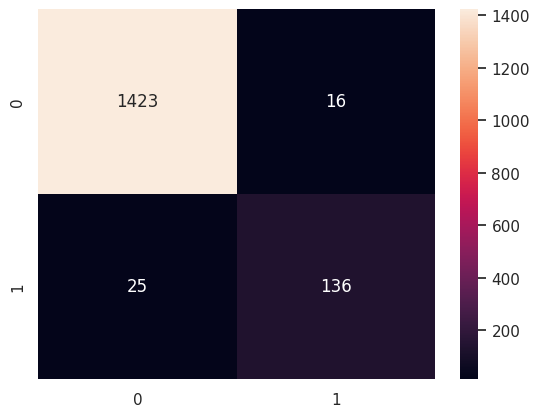

In [ ]:
model = XGBClassifier()

kfold = KFold(n_splits=10, random_state=7, shuffle=True)
model.fit(xtrain, ytrain)


y_pred = model.predict(xtest)

cm = confusion_matrix(ytest, y_pred)
sns.heatmap(cm,annot=True, fmt = 'g')

In [ ]:
?model

Object `model` not found.
